In [1]:
from utils import Activities, Users, InfoParser

import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.io as pio
pd.options.plotting.backend = "plotly"
import plotly.figure_factory as ff
from statsmodels.graphics.mosaicplot import mosaic

import seaborn as sns
import ptitprince as pt

png_renderer = pio.renderers["png"]
png_renderer.scale=3

pio.renderers.default = "notebook_connected"

import matplotlib.pyplot as plt

import numpy as np

from config_vars import month_map, month_order

In [2]:
pd.options.display.max_columns = None
pd.options.display.max_rows    = None

In [3]:
data_folder = "../data/"
raw_folder = "../data/mysql_extractions/"
results_folder = "../results/exports/"

#plotly style:
line_traces = dict(mode='lines+markers',line_shape='spline',line_smoothing=0.5,marker_size=10,marker_opacity=0.9)

In [4]:
inii = InfoParser("../report/data_info.ini")

# Table of Contents
* [Data Loading and Cleaning](#Data-Loading-and-Cleaning)
* [Data Exploring](#Data-Exploring)
	* [Overview:](#Overview:)
	* [Years trends and differences:](#Years-trends-and-differences:)
		* [Number of activities](#Number-of-activities)
		* [Number of activities per student](#Number-of-activities-per-student)
		* [Number of active users](#Number-of-active-users)
		* [Number of feedbacks](#Number-of-feedbacks)
		* [Number of feedback responses per supervisor](#Number-of-feedback-responses-per-supervisor)
		* [Number of feedback requests per student](#Number-of-feedback-requests-per-student)
		* [Activities images](#Activities-images)
		* [Activities total lenght](#Activities-total-lenght)
	* [Months trends:](#Months-trends:)
		* [Activities per month](#Activities-per-month)
			* [Creation](#Creation)
			* [Edits](#Edits)
			* [Curriculum](#Curriculum)
		* [Feedbacks](#Feedbacks)
	* [Feedbacks](#Feedbacks)
		* [Ratio](#Ratio)
		* [Edits and delay](#Edits-and-delay)
	* [Logins](#Logins)


# Data Loading and Cleaning

### Loading

In [5]:
data        = dict()
users       = list()
students    = list()
supervisors = list()
teachers    = list()
activities  = list()
months      = list()
feedbacks   = list()
logins      = list()

In [6]:
def db_switch(db = "all"):
    global users, students, supervisors, teachers, activities, months, feedbacks, logins
    users       = data[db]['users']
    students    = data[db]['students']
    supervisors = data[db]['supervisors']
    teachers    = data[db]['teachers']
    activities  = data[db]['activities']
    months      = data[db]['months']
    feedbacks   = data[db]['feedbacks']
    logins      = data[db]['logins']

In [7]:
cantons  = ["all","ticino","geneve"]
suffixes = ["","_TI","_GE"]

In [8]:
for canton,suffix in zip(cantons,suffixes):
    data[canton] = dict()
    data[canton]['users'] = pd.read_csv(f"{data_folder}users{suffix}.csv",sep="\t")
    data[canton]['students'] = pd.read_csv(f"{data_folder}students{suffix}.csv",sep="\t")
    data[canton]['supervisors'] = pd.read_csv(f"{data_folder}supervisors{suffix}.csv",sep="\t")
    data[canton]['teachers'] = pd.read_csv(f"{data_folder}teachers{suffix}.csv",sep="\t")

    activities = pd.read_csv(f"{data_folder}activities{suffix}.csv",sep="\t")
    
    activities = activities.merge(data[canton]['users'][['us_user','us_canton','gender']],
                                  on='us_user',how="left")
    
    data[canton]['activities'] = activities


    feedbacks = pd.read_csv(f"{raw_folder}activities_feedbacks_info{suffix}.csv")
    feedbacks = feedbacks.loc[feedbacks['ac_activity'].isin(activities['ac_activity']),:]
    data[canton]['feedbacks'] = feedbacks

    df_months = pd.read_csv(f"{raw_folder}months{suffix}.csv").fillna(0)
    df_months.replace({'month':month_map},inplace=True)
    df_months['month_order'] = df_months['month'].map(dict(zip(month_order,range(1,13))))
    df_months.sort_values(by=['month_order','activity_school_year'],inplace=True)

    y_users = df_months['n_users_per_year']
    df_months['norm_avg_n_user_recipes']        = df_months['n_recipes'].divide(y_users)
    df_months['norm_avg_n_user_experiences']    = df_months['n_experiences'].divide(y_users)
    df_months['norm_avg_n_activities']          = df_months['n_activities'].divide(y_users)
    
    data[canton]['months'] = df_months

    data[canton]['logins'] = pd.read_csv(f"{raw_folder}logins{suffix}.csv")

# Data Exploring

In [12]:
db_switch()

## Overview:

In [24]:
year_from = str(users.start_year.min()) + "-" + str(users.start_year.min()+1)
year_to   = str(users.start_year.max()) + "-" + str(users.start_year.max()+1)
n_users       = len(users)
n_supervisors = len(supervisors)
n_students    = len(students)
n_teachers    = len(teachers)
n_others_u    = n_users-(n_supervisors+n_students+n_teachers)
n_males       = len(users.query("gender == 1"))
n_females     = len(users.query("gender == 0"))
n_unknown     = n_users-n_males-n_females
users_from_TI = len(users.query("us_canton == 'TI'"))
users_from_GE = len(users.query("us_canton == 'GE'"))

inii.info('n_users',n_users)
inii.info('n_students',n_students)
inii.info('n_supervisors',n_supervisors)
inii.info('n_teachers',n_teachers)
inii.info('n_females',n_females)
inii.info('n_males',n_males)
inii.info('n_unknown',n_unknown)
inii.info('n_others_u',n_others_u)
inii.info('users_from_TI',users_from_TI)
inii.info('users_from_GE',users_from_GE)
inii.info('year_from',year_from)
inii.info('year_to',year_to)

print(f"There are {n_users} users: {n_students} students, {n_supervisors} supervisors, and {n_teachers} teachers")
print(f"{n_males} males, {n_females} females and {n_unknown} unknown")

There are 1002 users: 780 students, 177 supervisors, and 26 teachers
729 males, 257 females and 16 unknown


In [39]:
n_activities       = len(activities)
n_recipes          = len(activities.query("at_activityType == 'recipe'"))
n_experiences      = len(activities.query("at_activityType == 'experience'"))
activities_from_TI = len(activities.query("us_canton == 'TI'"))
activities_from_GE = len(activities.query("us_canton == 'GE'"))
activities_with_feedback_requests  = len(feedbacks)
activities_with_feedback_responses = feedbacks['response_date'].notna().sum()


inii.info('n_activities',n_activities)
inii.info('n_recipes',n_recipes)
inii.info('n_experiences',n_experiences)
inii.info('activities_from_TI',activities_from_TI)
inii.info('activities_from_GE',activities_from_GE)
inii.info('activities_with_feedback_requests',activities_with_feedback_requests)
inii.info('activities_with_feedback_responses',activities_with_feedback_responses)

In [37]:
activities_with_feedback_requests

5024

In [38]:
activities_with_feedback_responses

2051

In [53]:
activities.us_canton.isna().sum()

237

In [46]:
data_hist = activities.groupby(by=["creation_school_year","us_canton"]).size().reset_index(name="count")
fig = data_hist.plot.scatter(x='creation_school_year',y='count',color="us_canton")
data_hist = activities.groupby(by=["creation_school_year"]).size().reset_index(name="count")
fig.add_trace(data_hist.plot.scatter(x="creation_school_year",y="count").data[0])
fig.update_xaxes(type="category")
fig.update_traces(line_traces)

In [40]:
data_hist = activities.groupby(by=["activity_school_year","creation_school_year"]).size().reset_index(name="count")
fig = data_hist.plot.scatter(x='creation_school_year',y='count',facet_col="activity_school_year")
fig.update_xaxes(title=dict(text=""),tickangle=45,type="category")
fig.update_traces(line_traces)

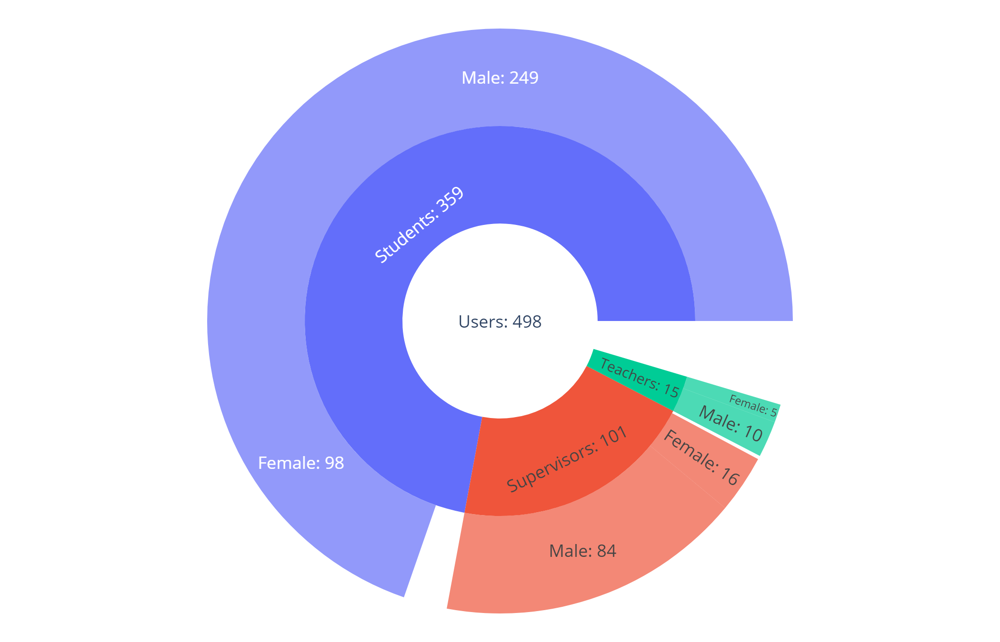

In [17]:
fig =go.Figure(go.Sunburst(
   ids=["Users","Students","Supervisors","Teachers","st-Male","st-Female","sp-Male","sp-Female","tc-Male","tc-Female"],
   labels=["Users","Students","Supervisors","Teachers","Male","Female","Male","Female","Male","Female"],
   parents=["","Users","Users","Users", "Students", "Students", "Supervisors","Supervisors","Teachers","Teachers"],
   values=[len(users),len(students),len(supervisors),len(teachers),
           len(students.query("gender == 1")),len(students.query("gender == 0")),
           len(supervisors.query("gender == 1")),len(supervisors.query("gender == 0")),
           len(teachers.query("gender == 1")),len(teachers.query("gender == 0")),
          ],
   branchvalues="total",
   texttemplate = "%{label}: %{value}" ,
))
fig.update_layout(margin = dict(t=20, l=0, r=0, b=20))

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()
fig.write_html(f"{results_folder}users_type_gender{suffix}.html" , include_plotlyjs = False)

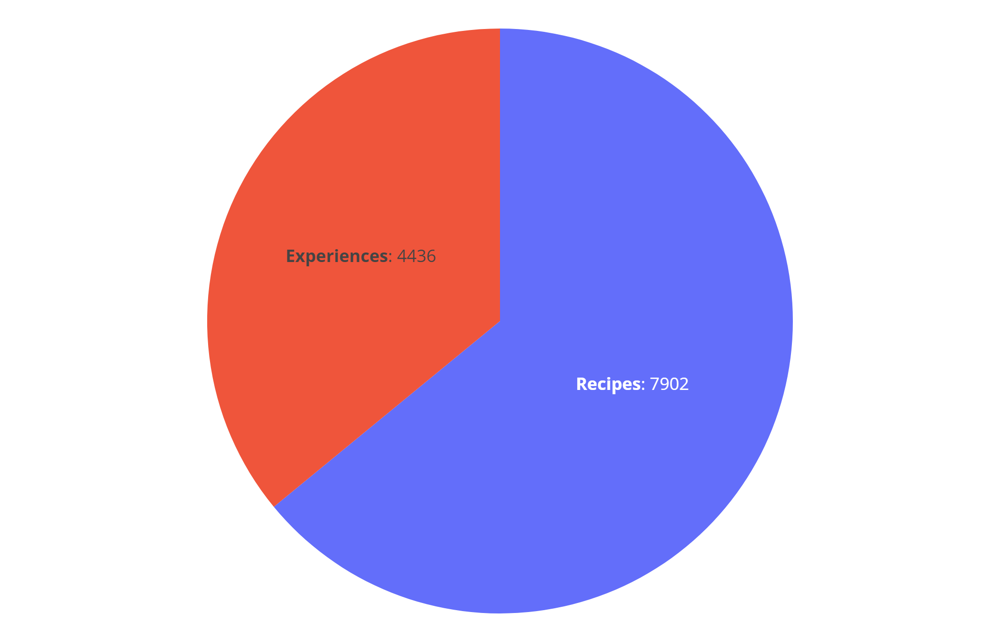

In [18]:
labels = ['Recipes','Experiences']
values = [len(activities.df.query("at_activityType=='recipe'")), 
          len(activities.df.query("at_activityType=='experience'"))]

fig = go.Figure(data=[go.Pie(labels=labels, 
                             values=values,texttemplate = "<b>%{label}</b>: %{value}" ,
)])
fig.update_layout(margin = dict(t=20, l=0, r=0, b=20),showlegend=False)

fig.show()
fig.write_html(f"{results_folder}activities_type{suffix}.html" , include_plotlyjs = False)

----------------

## Years trends and differences:

###  Number of activities

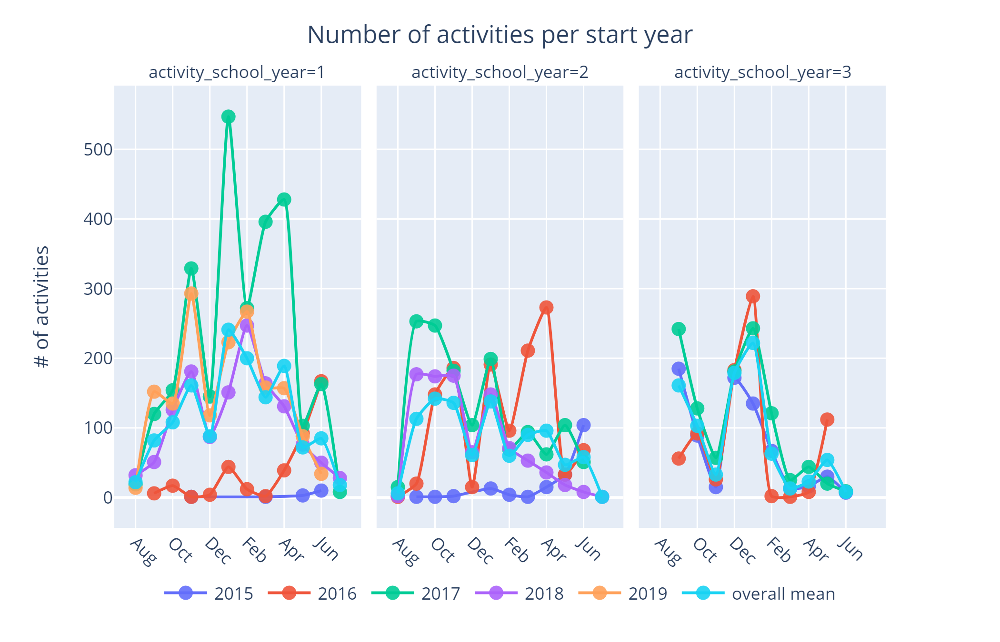

In [19]:
hist_data = activities.df.groupby(by=['creation_month','activity_school_year','start_year'],sort=False).size().reset_index(name="count")
hist_data = activities.sort_month(hist_data,'creation_month',['activity_school_year','start_year'])

mean_hist = activities.sort_month(
    hist_data.groupby(by=["creation_month","activity_school_year"]).mean().round().reset_index(),
    'creation_month',['activity_school_year','start_year'])
mean_hist['start_year'] = "overall mean"

hist_data = hist_data.append(mean_hist, ignore_index=True)

fig = hist_data.plot(x="creation_month", y=["count"], facet_col='activity_school_year', color="start_year",
    category_orders={"creation_month":month_order,"activity_school_year":[1,2,3],"start_year":[2013,2014,2015,2016,2017,2018,2019]}
)
fig.update_layout(
    title="Number of activities per start year",
    title_x=0.5,
    yaxis_title="# of activities",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top',traceorder='normal'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45)
fig.update_traces(line_traces)

fig.show()
fig.write_html(f"{results_folder}activities_per_vintage{suffix}.html" , include_plotlyjs = False)

-----

### Number of activities per student

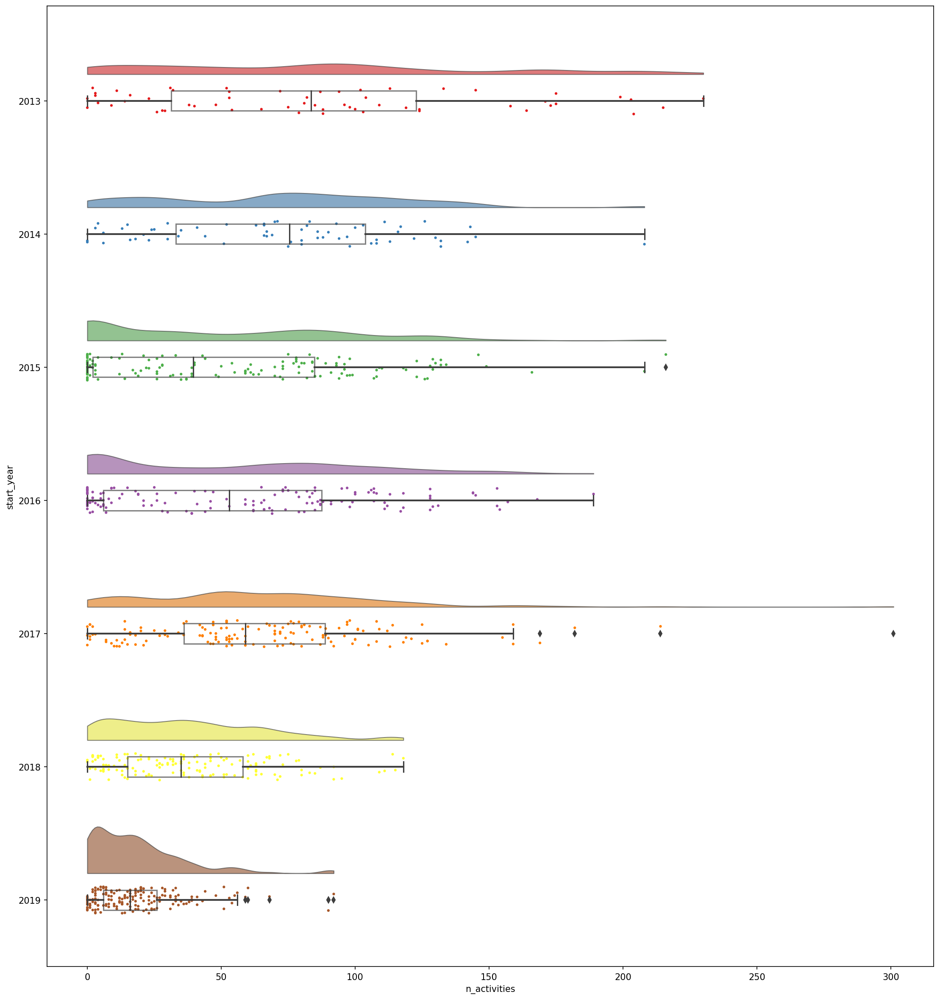

In [45]:
fig= plt.figure(figsize=(18,20),dpi=150)

pt.RainCloud(x = 'start_year', y = 'n_activities', 
                  data = students, orient = 'h',
                  move = .0,alpha = .65, palette = "Set1")

plt.show()

In [83]:
a = students.query("n_activities > 0").groupby('start_year')['n_activities'].apply(list)

In [86]:
# Create distplot with custom bin_size
fig = ff.create_distplot(a.values, a.index.astype("str"), bin_size=8, show_rug=False)
fig.show()

In [60]:
df = px.data.tips()
fig = px.histogram(students.sort_values(by=["start_year"]), x="n_activities", color="start_year",
                   marginal="box", # or violin, rug,
                   opacity=0.6,
                   nbins=100,
                  )
fig.update_layout(
    width=900,
    height=900,
)
fig.update_layout(barmode='overlay')
fig.show()

In [91]:
users.columns

Index(['us_user', 'user_name', 'user_email', 'start_semester', 'start_year',
       'archived', 'user_type', 'HGF', 'convocatore', 'teacher', 'supervisor',
       'ispettore', 'statista', 'student', 'classes', 'companies',
       'n_activities', 'n_activities_school_year_1',
       'n_activities_school_year_2', 'n_activities_school_year_3', 'n_recipes',
       'n_experiences', 'n_reflections', 'n_recipe_reflections',
       'n_experience_reflections', 'n_in_curriculum',
       'n_recipes_in_curriculum', 'n_experiences_in_curriculum',
       'n_in_curriculum_semester1', 'n_in_curriculum_semester2',
       'n_in_curriculum_semester3', 'n_in_curriculum_semester4',
       'n_in_curriculum_semester5', 'n_feedback_requests',
       'n_received_feedback_responses', 'n_received_feedback_requests',
       'n_feedback_responses', 'avg_activity_evaluations',
       'avg_reflection_length', 'avg_specific_evaluations',
       'avg_supervisor_evaluation', 'n_files', 'n_folders', 'us_canton',
       

In [90]:
len(students.query("n_activities == 0"))

79

In [19]:
fig = students.sort_values(by=["start_year"]).plot.box(
    x="start_year",y="n_activities", color="start_year",
    hover_data =["us_user","n_activities","start_year"]
)

fig.update_layout(
    title="Number of activities per student per start year",
    title_x=0.5,
    yaxis_title="Activities per student",
    xaxis_title="Start Year",
)

#fig.update_yaxes(range=[0, 310])

fig.show()
fig.write_html(f"{results_folder}activities_per_user_per_vintage{suffix}.html" , include_plotlyjs = False)

------------

### Number of active users

In [19]:
hist_data = activities.df.groupby(by=['activity_school_year','start_year','us_user'],sort=False).size().reset_index(name="count")
active_users_per_year = hist_data.query("count > 0").drop("us_user",axis=1).groupby(by=['activity_school_year','start_year'],sort=False).size().reset_index(name="count").sort_values(by=["start_year","activity_school_year"])
activities_per_user = hist_data.drop("us_user",axis=1).groupby(by=['activity_school_year','start_year'],sort=False).mean().reset_index().sort_values(by=["start_year","activity_school_year"]).rename(columns={'count':'activities_per_user'})
df = active_users_per_year.merge(activities_per_user, on=["activity_school_year","start_year"],how="left")

In [20]:
fig = df.plot.scatter(x="start_year", y="count", facet_col='activity_school_year', color="activities_per_user")
fig.update_layout(
    title="Number of active users per year",
    title_x=0.5,
    yaxis_title="# of actitve users",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45, type="category")
fig.update_traces(line_traces)
fig.update_traces(line_traces,line=dict(color="gray"))

fig.show()

-----

### Number of feedbacks

In [23]:
hist_data = feedbacks.groupby(by=['activity_school_year','start_year'],sort=False).size().reset_index(name="count")

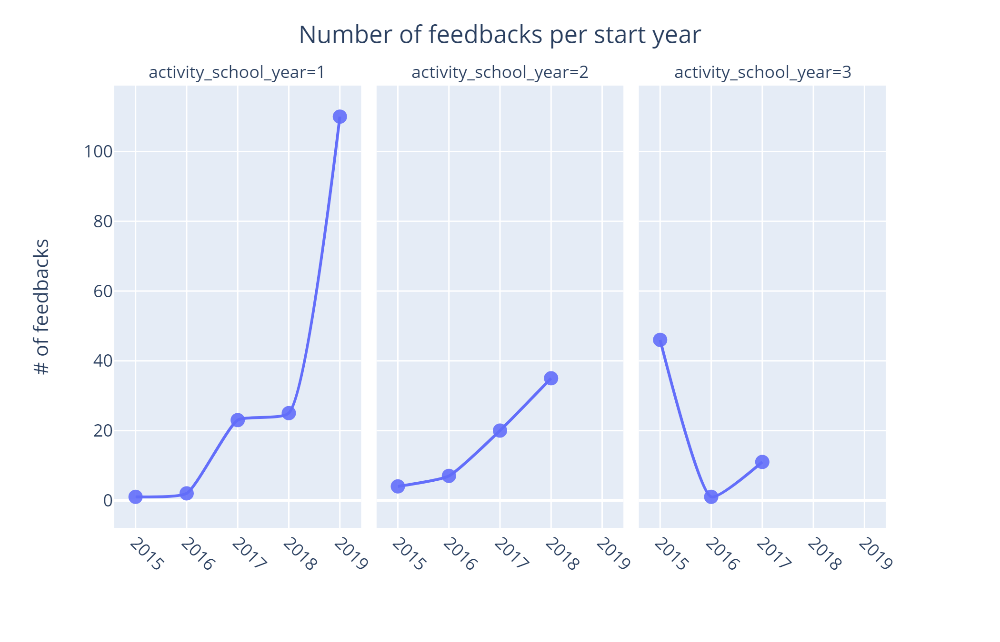

In [24]:
fig = hist_data.plot(x="start_year", y=["count"], facet_col='activity_school_year')
fig.update_layout(
    title="Number of feedbacks per start year",
    title_x=0.5,
    yaxis_title="# of feedbacks",
    showlegend=False,
)
fig.update_xaxes(title=dict(text=""),tickangle=45,type="category")
fig.update_traces(line_traces)

fig.show()
fig.write_html(f"{results_folder}feedbacks_per_vintage{suffix}.html" , include_plotlyjs = False)

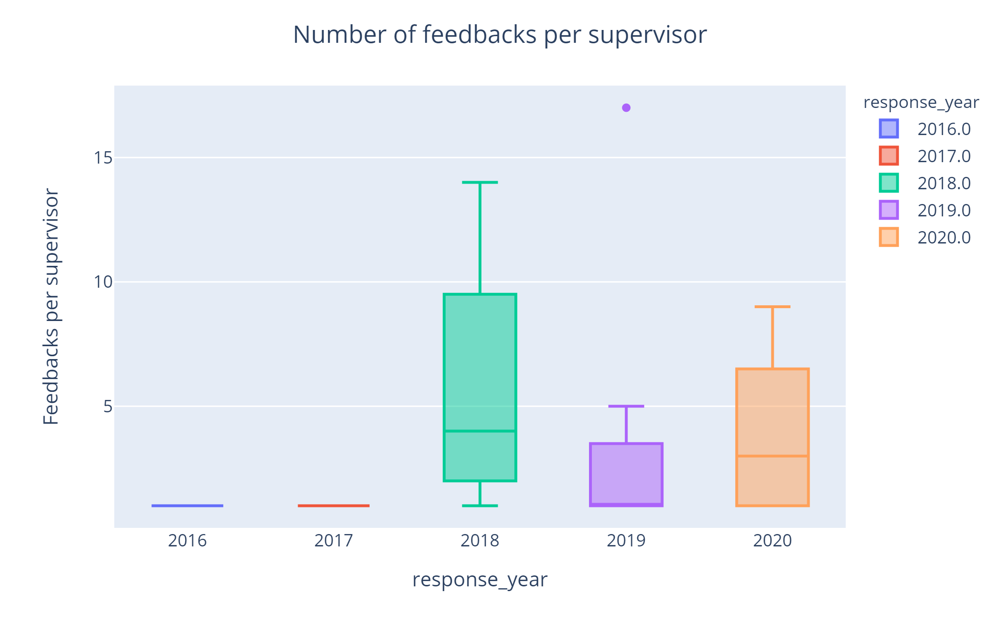

In [25]:
feedbacks['response_year'] = pd.DatetimeIndex(feedbacks['response_date']).year
data_hist = feedbacks.groupby(by=['recipient','response_year']).size().reset_index(name="count")

fig = data_hist.sort_values(by=["response_year"]).query("count < 50").plot.box(
    x="response_year",y="count", color="response_year", 
    hover_data =["recipient","response_year","count"]
)

fig.update_layout(
    title="Number of feedbacks per supervisor",
    title_x=0.5,
    yaxis_title="Feedbacks per supervisor",
)

fig.show()
fig.write_html(f"{results_folder}feedbacks_per_user_per_vintage{suffix}.html" , include_plotlyjs = False)

-----

### Number of feedback responses per supervisor

In [22]:
fig = supervisors.sort_values(by=["start_year"]).plot.box(
    x="start_year",y="n_feedback_responses", color="start_year",
    hover_data =["us_user","user_name","n_feedback_responses","start_year"]
)

fig.update_layout(
    title="Number of feedbacks per supervisor per start year",
    title_x=0.5,
    yaxis_title="Feedbacks per supervisor",
)

fig.show()

-----

### Number of feedback requests per student

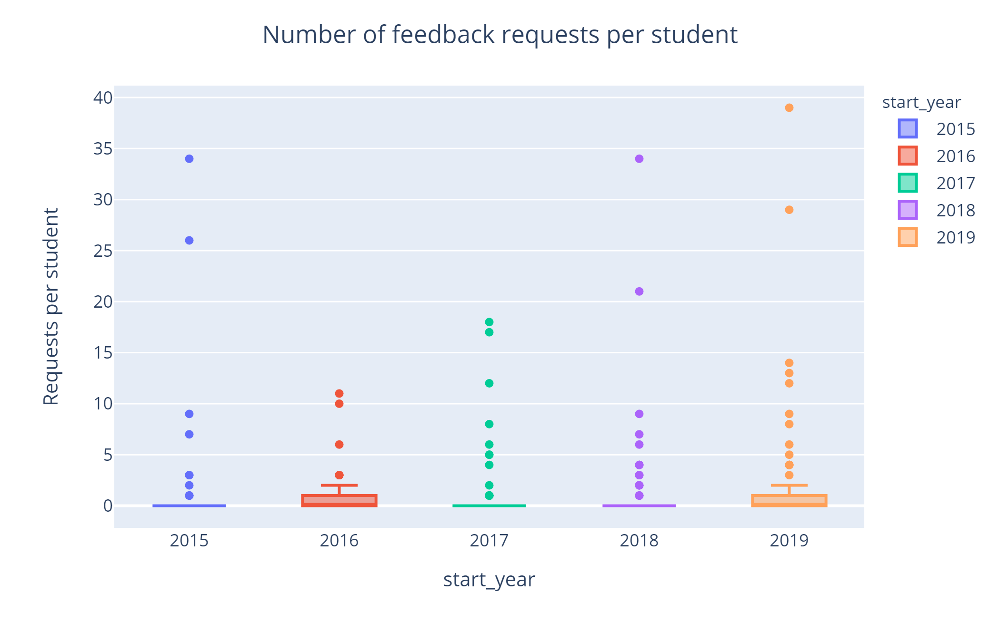

In [26]:
fig = students.sort_values(by=["start_year"]).query("n_feedback_requests < 75").plot.box(
    x="start_year",y="n_feedback_requests", color="start_year",
    hover_data =["us_user","user_name","n_feedback_requests","start_year"]
)

fig.update_layout(
    title="Number of feedback requests per student",
    title_x=0.5,
    yaxis_title="Requests per student",
)

fig.show()
fig.write_html(f"{results_folder}feedback_requests_per_user_per_year{suffix}.html" , include_plotlyjs = False)

-----------

### Activities images

In [24]:
fig = activities.df.sort_values(by=["start_year","activity_school_year"]).plot.box(
    x="activity_school_year",y="n_images", 
    color="start_year", 
    hover_data =["ac_activity","ac_title","activity_total_length","start_year"]
)

fig.update_layout(
    title="Number of images per activity",
    title_x=0.5,
)

fig.show()

------

### Activities total lenght

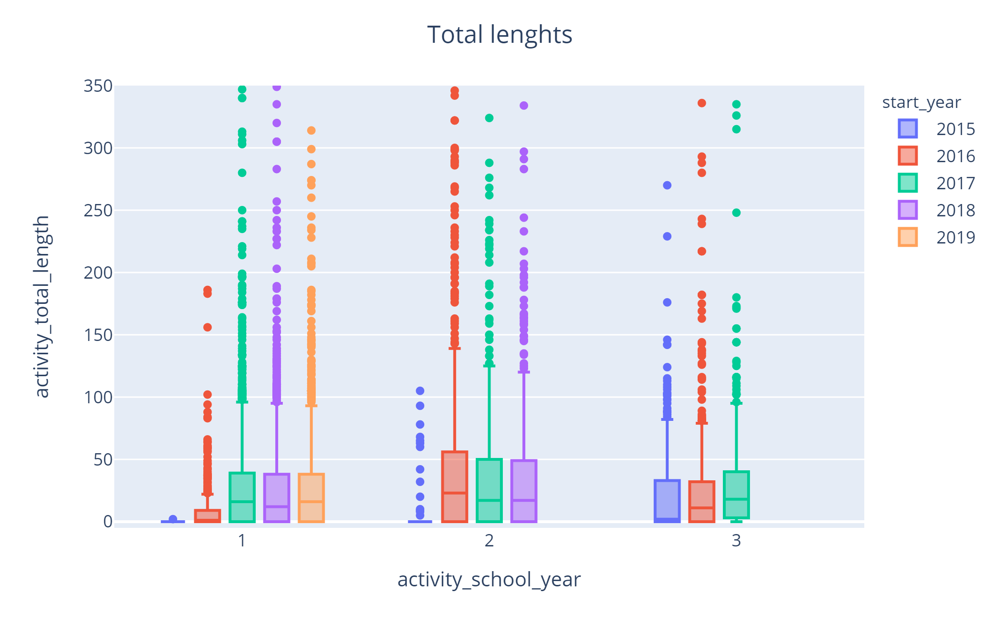

In [27]:
fig = activities.df.sort_values(by=["start_year","activity_school_year"]).query("activity_total_length < 350").plot.box(
    x="activity_school_year",y="activity_total_length", 
    color="start_year", 
    hover_data =["ac_activity","ac_title","activity_total_length","start_year"]
)

fig.update_layout(
    title="Total lenghts",
    title_x=0.5,
)

fig.update_yaxes(range=[-5, 350])

fig.show()
fig.write_html(f"{results_folder}activities_total_length_per_vintage{suffix}.html" , include_plotlyjs = False)

-----

## Months trends:

### Activities per month

#### Creation

In [26]:
fig = df_months.plot(x="month", y=["n_activities"],facet_col='activity_school_year')
fig.update_layout(
    title="Total number of activities per month",
    title_x=0.5,
    yaxis_title="# activities",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45)
fig.update_traces(line_traces)

fig.show()

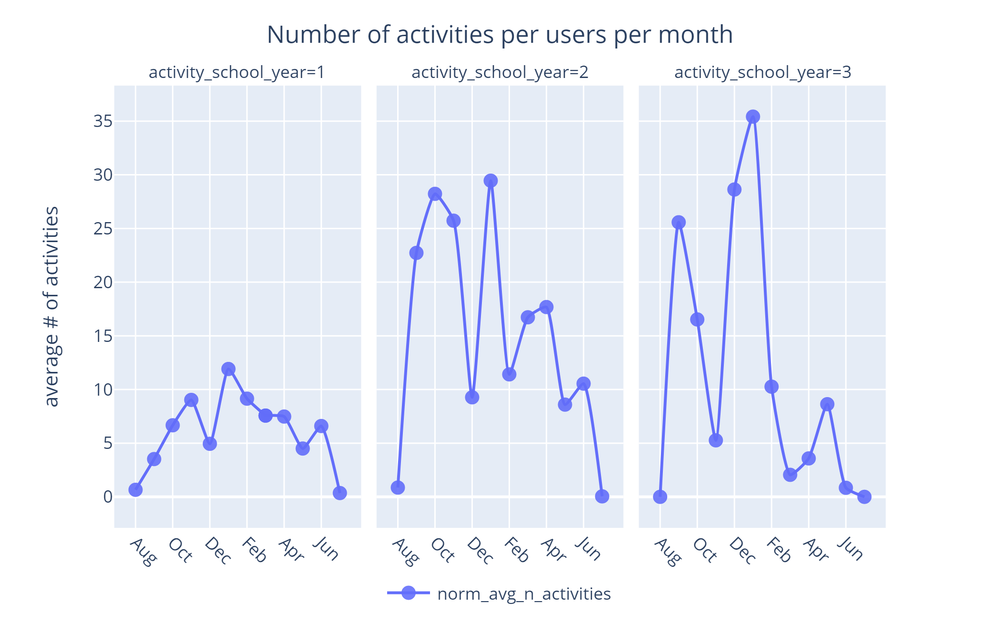

In [28]:
fig = df_months.plot(x="month", y=["norm_avg_n_activities"],facet_col='activity_school_year')
fig.update_layout(
    title="Number of activities per users per month",
    title_x=0.5,
    yaxis_title="average # of activities",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45)
fig.update_traces(line_traces)

fig.show()
fig.write_html(f"{results_folder}average_activities_per_user_per_month{suffix}.html" , include_plotlyjs = False)

#### Edits

In [117]:
fig = df_months.plot(x="month", y=["n_edits"],facet_col='activity_school_year')
fig.update_layout(
    title="Total number of activities per month",
    title_x=0.5,
    yaxis_title="# activities",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45)
fig.update_traces(line_traces)

fig.show()

#### Curriculum

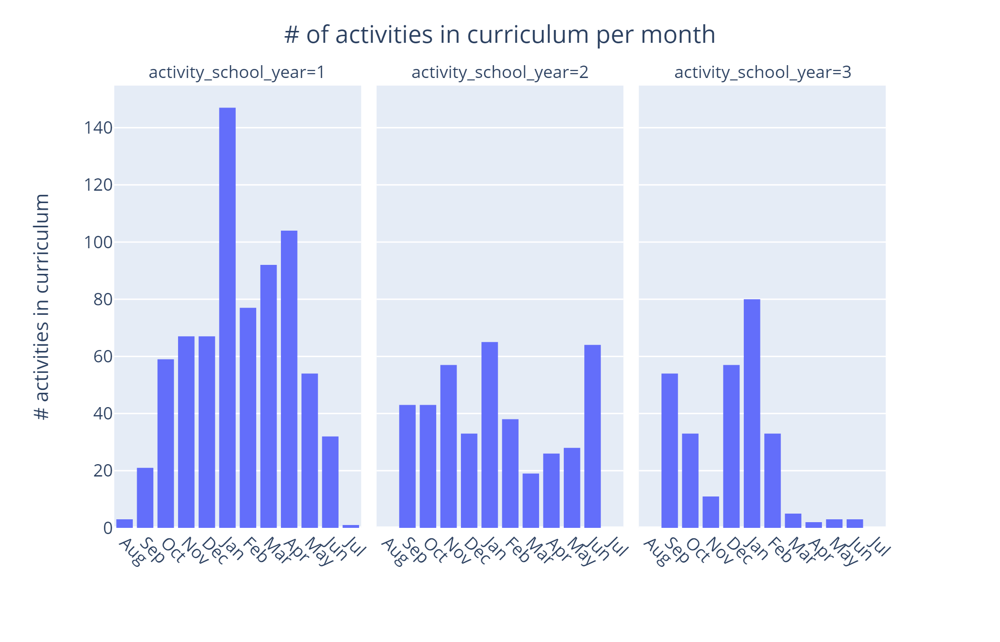

In [29]:
fig = activities.sort_month(
        activities.df[['last_edit_month','activity_school_year','in_curriculum']],
        'last_edit_month',['activity_school_year']
).hist(x="last_edit_month", y="in_curriculum", 
        facet_col='activity_school_year',
)

fig.update_layout(
    title="# of activities in curriculum per month",
    title_x=0.5,
    yaxis_title="# activities in curriculum",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45)



fig.show()
fig.write_html(f"{results_folder}activities_in_curriculum_per_month{suffix}.html" , include_plotlyjs = False)

-------------

### Feedbacks

In [30]:
feedbacks['response_month'] = pd.DatetimeIndex(feedbacks['response_date']).month
feedbacks.replace({'response_month':month_map},inplace=True)
feedbacks['request_month'] = pd.DatetimeIndex(feedbacks['request_date']).month
feedbacks.replace({'request_month':month_map},inplace=True)

In [31]:
hist_requests = activities.sort_month(
    feedbacks.groupby(['activity_school_year','request_month']).size().reset_index(name="count"),
    'request_month',['activity_school_year']
).rename(columns={'request_month':'month'}).assign(type = 'request')

hist_responses = activities.sort_month(
    feedbacks.groupby(['activity_school_year','response_month']).size().reset_index(name="count"),
    'response_month',['activity_school_year']
).rename(columns={'response_month':'month'}).assign(type = 'response')

hist_data = hist_requests.append(hist_responses)

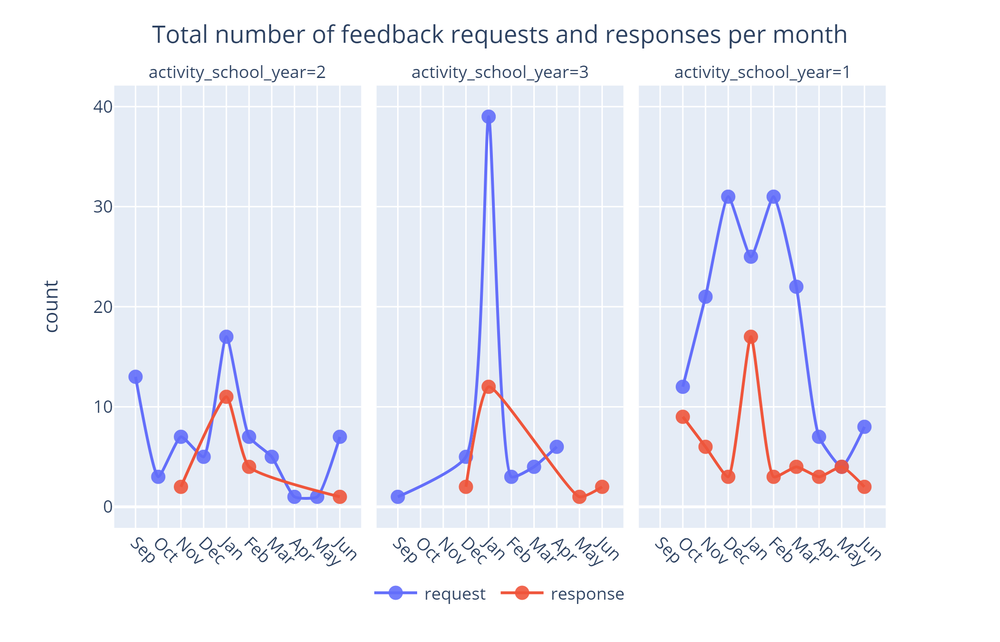

In [32]:
fig = hist_data.plot(
    x="month", y=["count"],facet_col='activity_school_year', color="type"
)

fig.update_layout(
    title="Total number of feedback requests and responses per month",
    title_x=0.5,
    yaxis_title="count",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)
fig.update_xaxes(title=dict(text=""),tickangle=45)
fig.update_traces(line_traces)


fig.show()
fig.write_html(f"{results_folder}feedbacks_requests_and_responses_per_month{suffix}.html" , include_plotlyjs = False)

In [33]:
feedbacks['has_response'] = feedbacks['response_date'].notnull()

In [34]:
a = feedbacks.groupby(["request_month","activity_school_year"]).sum()['has_response'].div(
        feedbacks.groupby(["request_month","activity_school_year"]).size()
    ).reset_index(name="ratio")

total = feedbacks.groupby(["request_month","activity_school_year"]).size()

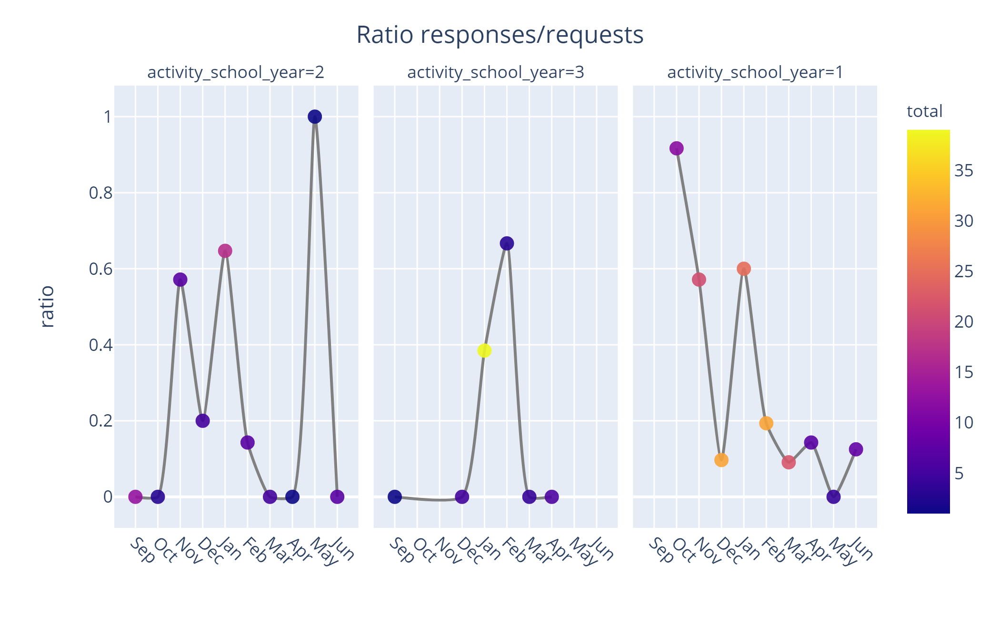

In [35]:
fig = activities.sort_month(
    feedbacks.groupby(["request_month","activity_school_year"]).sum()['has_response'].div(
        feedbacks.groupby(["request_month","activity_school_year"]).size()
    ).reset_index(name="ratio").assign(
        total = feedbacks.groupby(["request_month","activity_school_year"]).size().values.astype('int64')
    ),'request_month',['activity_school_year']
).plot.scatter(
    x="request_month", y=["ratio"],facet_col='activity_school_year', 
    size="total", 
    color="total",
    size_max=60
)

fig.update_layout(
    title="Ratio responses/requests",
    title_x=0.5,
    yaxis_title="ratio",
    showlegend = False
)
fig.update_xaxes(title=dict(text=""),tickangle=45)
fig.update_traces(line_traces,line=dict(color="gray"))


fig.show()
fig.write_html(f"{results_folder}ratio_responses_requests{suffix}.html" , include_plotlyjs = False)

-----

## Feedbacks

### Ratio

In [37]:
tot_req = feedbacks.groupby(['recipient']).size().reset_index(name="received").rename(columns={'recipient':'us_user'})
ratio = tot_req.merge(feedbacks.query("has_response == True").groupby(['recipient']).size().reset_index(name="responsed").rename(columns={'recipient':'us_user'}),on="us_user",how="left").fillna(0)
ratio['ratio'] = ratio['responsed'].div(ratio['received'])
ratio = ratio.merge(supervisors[['us_user','start_year','user_name']],on="us_user",how="right").dropna()
ratio.sort_values(by="ratio",inplace=True)

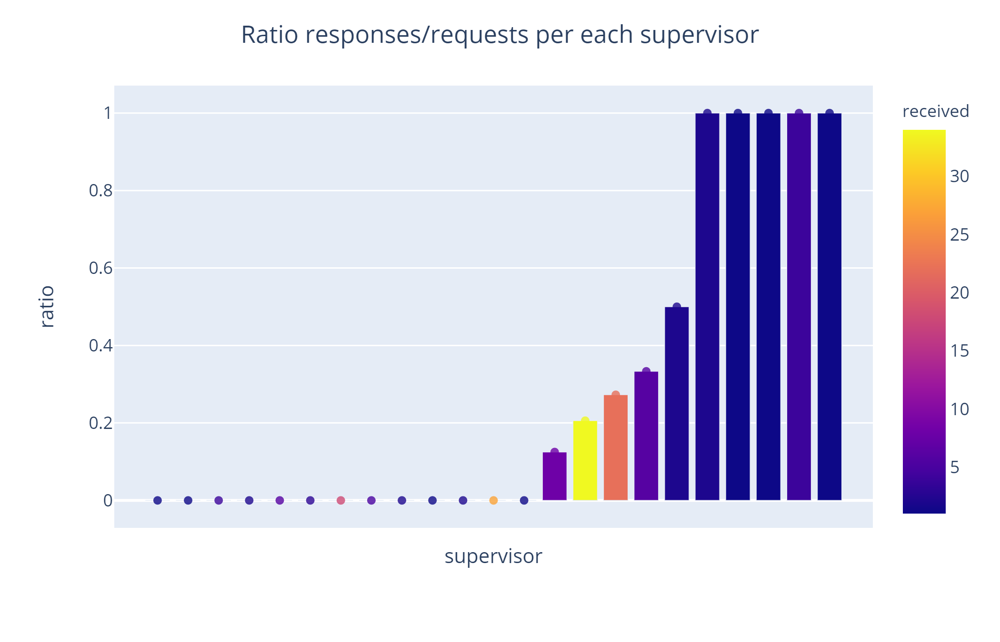

In [38]:
fig = ratio.plot.scatter(x="us_user",y="ratio",color="received")
fig.update_layout(
    title="Ratio responses/requests per each supervisor", 
    title_x=0.5,
    xaxis_title='supervisor',
    xaxis_type='category'
)
fig.update_traces(mode='markers',opacity=0.8,)

fig.add_trace(ratio.plot.bar(x="us_user",y="ratio",color="received").data[0])

fig.update_xaxes(showticklabels=False)

fig.show()
fig.write_html(f"{results_folder}ratio_responses_per_supervisor{suffix}.html" , include_plotlyjs = False)

In [39]:
ratio['norm'] = ratio['responsed']*ratio['ratio']**2
bests=ratio.sort_values(by=["norm"],ascending=False).head(10)

In [40]:
bests

,us_user,received,responsed,ratio,start_year,user_name,norm
19,1000796,4.0,4.0,1.000000,2019,Frederic Mercader Formateur,4.000000
4,1000242,2.0,2.0,1.000000,2016,Lionel Jan Formateur,2.000000
7,1000351,1.0,1.0,1.000000,2017,Raphaël Jean Mairet,1.000000
17,1000780,1.0,1.0,1.000000,2019,Guillard Nicolas,1.000000
14,1000439,1.0,1.0,1.000000,2017,Macé Sébastien,1.000000
1,1000179,22.0,6.0,0.272727,2017,Chauvot Hugues,0.446281
16,1000779,34.0,7.0,0.205882,2019,Steve Haller,0.296713
6,1000315,2.0,1.0,0.500000,2017,Boucher Emmanuel,0.250000
21,1000812,6.0,2.0,0.333333,2019,Jeremy Abad,0.222222
20,1000805,8.0,1.0,0.125000,2019,Miguel Beltran,0.015625


In [41]:
resps = feedbacks.query("has_response == True").groupby(by=['recipient','response_year']).size().reset_index(name="responsed")

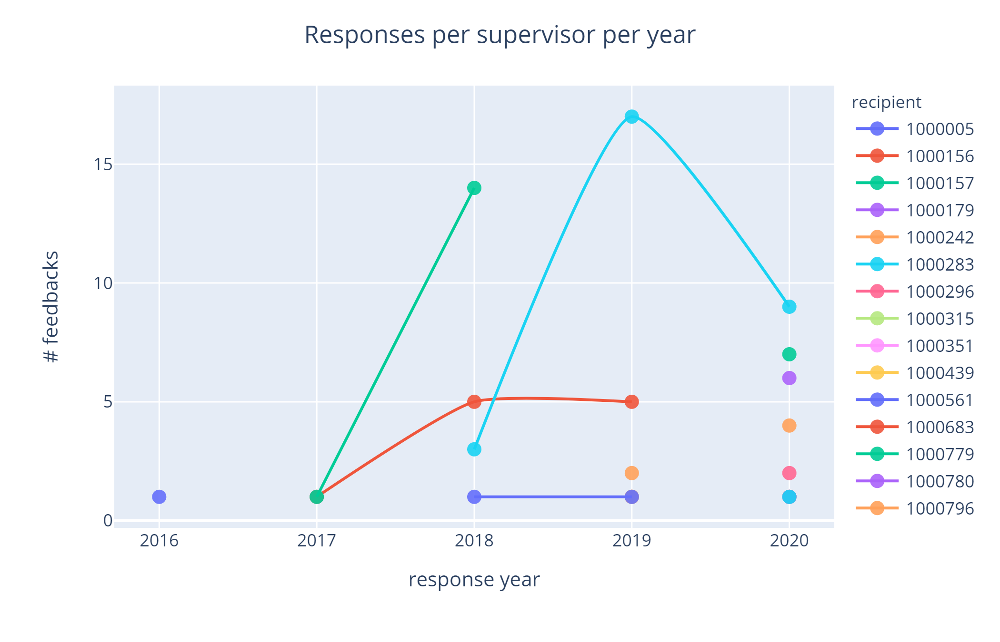

In [42]:
fig = resps.plot(x="response_year",y="responsed",color="recipient")
fig.update_layout(
    title="Responses per supervisor per year", 
    title_x=0.5,
    xaxis_title='response year',
    yaxis_title='# feedbacks',
    xaxis_type='category'
)
fig.update_traces(line_traces)

-------

### Edits and delay

In [43]:
df_feedbacks_info = feedbacks

In [44]:
no_answer = df_feedbacks_info['student_grade'].isnull().sum()
print(f'There are {no_answer}/{len(df_feedbacks_info)} without student grade ({round(no_answer/len(df_feedbacks_info),4)*100}%)')

There are 69/285 without student grade (24.21%)


In [45]:
no_answer = df_feedbacks_info['response_date'].isnull().sum()
print(f'There are {no_answer}/{len(df_feedbacks_info)} without answer ({round(no_answer/len(df_feedbacks_info),3)*100}%)')

There are 199/285 without answer (69.8%)


In [46]:
no_answer = df_feedbacks_info['supervisor_grade'].isnull().sum()
print(f'There are {no_answer}/{len(df_feedbacks_info)} without supervisor grade ({round(no_answer/len(df_feedbacks_info),4)*100}%)')

There are 202/285 without supervisor grade (70.88%)


In [47]:
response_no_grade = (df_feedbacks_info['response_date'].notnull() & df_feedbacks_info['supervisor_grade'].isnull()).sum()
grade_no_response = (df_feedbacks_info['response_date'].isnull() & df_feedbacks_info['supervisor_grade'].notnull()).sum()

print(f'There are {response_no_grade} responses without grades')

There are 37 responses without grades


In [48]:
grade_no_response #TODO: VERIFICARE QUESTO!

34

In [49]:
df_feedbacks_info.dropna(inplace=True)
df_feedbacks_info['delay_days'] = df_feedbacks_info['delay_hours']/24

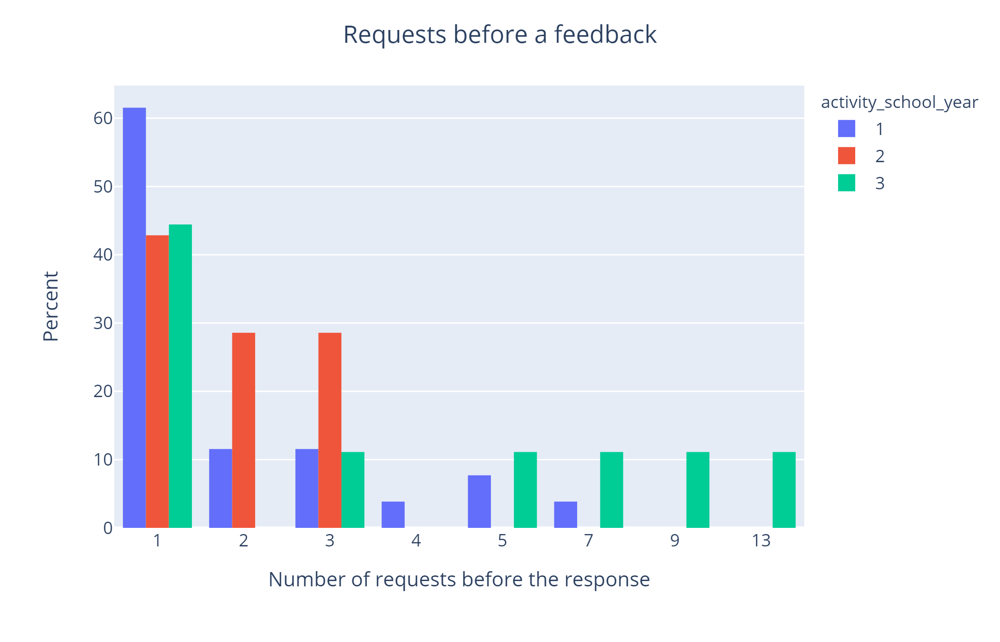

In [50]:
df_hist = df_feedbacks_info.groupby(["activity_school_year","times_before_answer"]).count()[['ac_activity']].reset_index().rename(columns={'ac_activity': 'count'})


fig = df_hist.plot.hist(x="times_before_answer", y='count', 
                         color = "activity_school_year", histnorm='percent' )

fig.update_layout(
    barmode='group',
    xaxis_type='category',
    title="Requests before a feedback",
    title_x=0.5,
    yaxis_title="Percent",
    xaxis_title="Number of requests before the response",
    coloraxis_showscale=False,
)

fig.show()

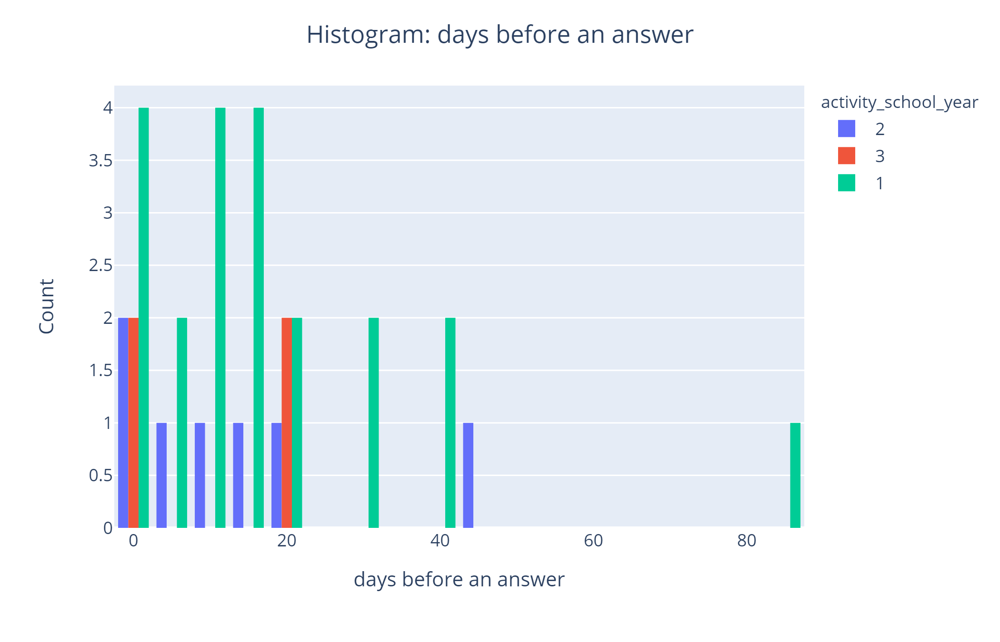

In [51]:
fig = df_feedbacks_info[df_feedbacks_info['delay_days']<100].plot.hist(x="delay_days",  nbins=30,
                         color = "activity_school_year" )

fig.update_layout(
    barmode='group',
    title="Histogram: days before an answer",
    title_x=0.5,
    yaxis_title="Count",
    xaxis_title="days before an answer",
    coloraxis_showscale=False,
)

fig.show()

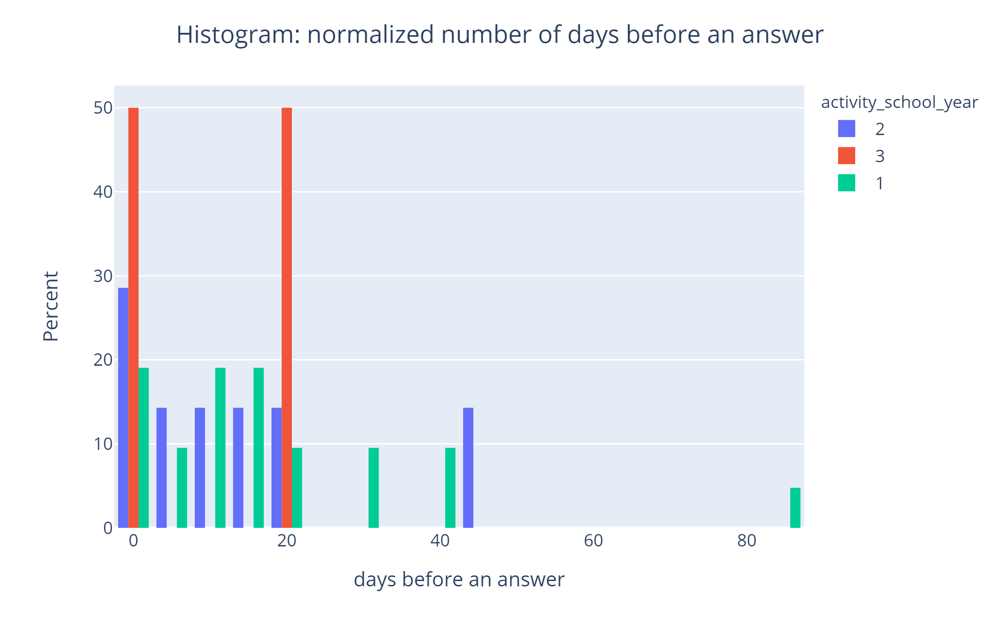

In [52]:
fig = df_feedbacks_info[df_feedbacks_info['delay_days']<100].plot.hist(x="delay_days",  nbins=30,
                         color = "activity_school_year", histnorm='percent' )

fig.update_layout(
    barmode='group',
    title="Histogram: normalized number of days before an answer",
    title_x=0.5,
    yaxis_title="Percent",
    xaxis_title="days before an answer",
    coloraxis_showscale=False,
)

fig.show()

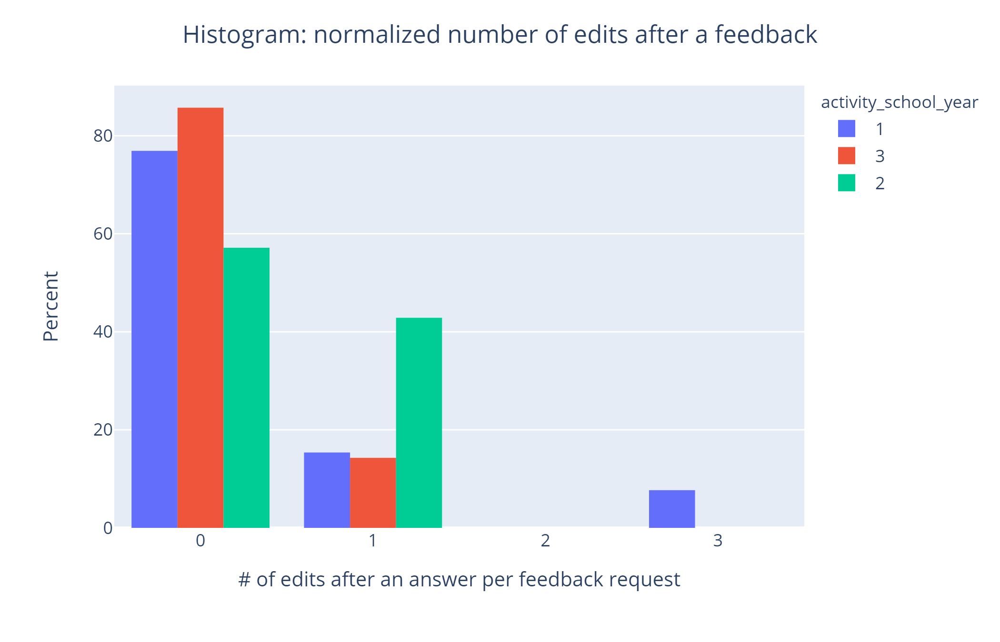

In [53]:
fig = df_feedbacks_info[df_feedbacks_info['edits_after']<5].plot.hist(x="edits_after",  nbins=5,
                         color = "activity_school_year", histnorm='percent' )

fig.update_layout(
    barmode='group',
    title="Histogram: normalized number of edits after a feedback",
    title_x=0.5,
    yaxis_title="Percent",
    xaxis_title="# of edits after an answer per feedback request",
)

fig.show()

In [54]:
df_feedbacks_info['has_edit_after'] = (df_feedbacks_info['edits_after']>0).astype(int)

In [55]:
df_count = df_feedbacks_info.groupby(["activity_school_year","supervisor_grade","has_edit_after"]).size().reset_index(name='count')

c = (pd.core.reshape.util.cartesian_product([df_count['activity_school_year'].unique(),df_count['supervisor_grade'].unique(),df_count['has_edit_after'].unique()]))
c = pd.DataFrame(dict(activity_school_year=c[0],supervisor_grade=c[1],has_edit_after=c[2]))
c = c.set_index(["activity_school_year","supervisor_grade","has_edit_after"]).join(df_count.set_index(["activity_school_year","supervisor_grade","has_edit_after"])).reset_index().sort_values(by=['activity_school_year','supervisor_grade'])
c.fillna(0,inplace=True)

df_feedback_edits =  c[c['has_edit_after']==True].drop("has_edit_after",axis=1).rename(columns={'count':'edit'})
df_feedback_edits['no_edit'] = c[c['has_edit_after']==False]['count'].tolist()

df_feedback_edits['ratio'] = df_feedback_edits['edit'].div(df_feedback_edits['no_edit']+df_feedback_edits['edit']).fillna(0)

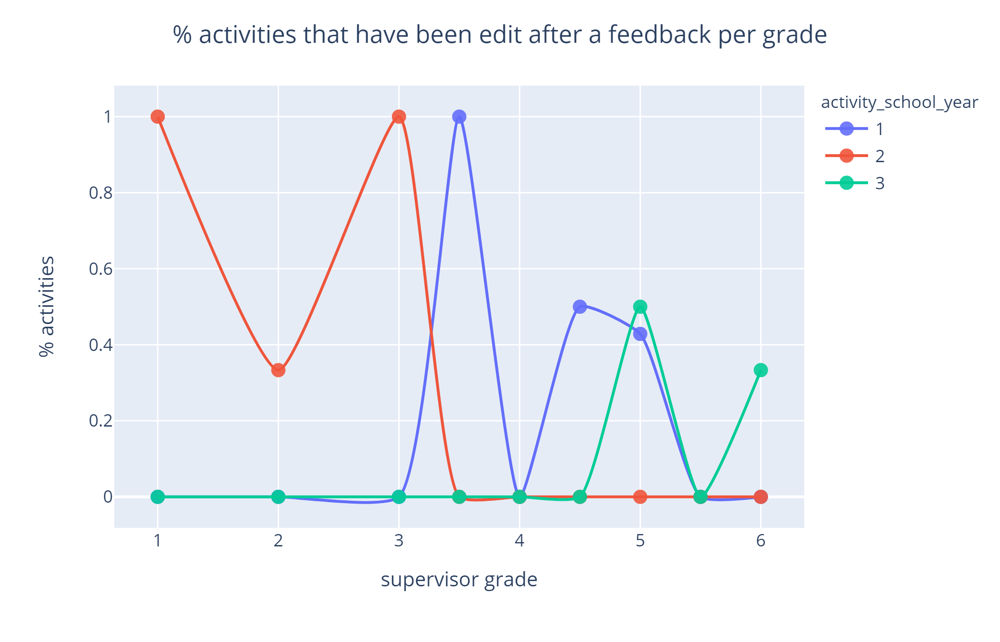

In [56]:
fig = df_feedback_edits.plot(x="supervisor_grade", y=["ratio"],
                             line_group='activity_school_year', color='activity_school_year')
fig.update_layout(
    title="% activities that have been edit after a feedback per grade",
    title_x=0.5,
    yaxis_title="% activities",
    xaxis_title="supervisor grade",
)
fig.update_traces(line_traces)


fig.show()
fig.write_html(f"{results_folder}activities_edits_after_feedback{suffix}.html" , include_plotlyjs = False)

--------------

## Logins

In [57]:
dayofweek_map = {1:'Sun',2:'Mon',3:'Tue',4:'Wed',5:'Thu',6:'Fri',7:'Sat'}

logins_students = logins.merge(students,on="us_user",how="inner")
logins_supervisors = logins.merge(supervisors,on="us_user",how="inner")
logins_teachers = logins.merge(teachers,on="us_user",how="inner")

logins['date'] = logins['date'].astype('datetime64')

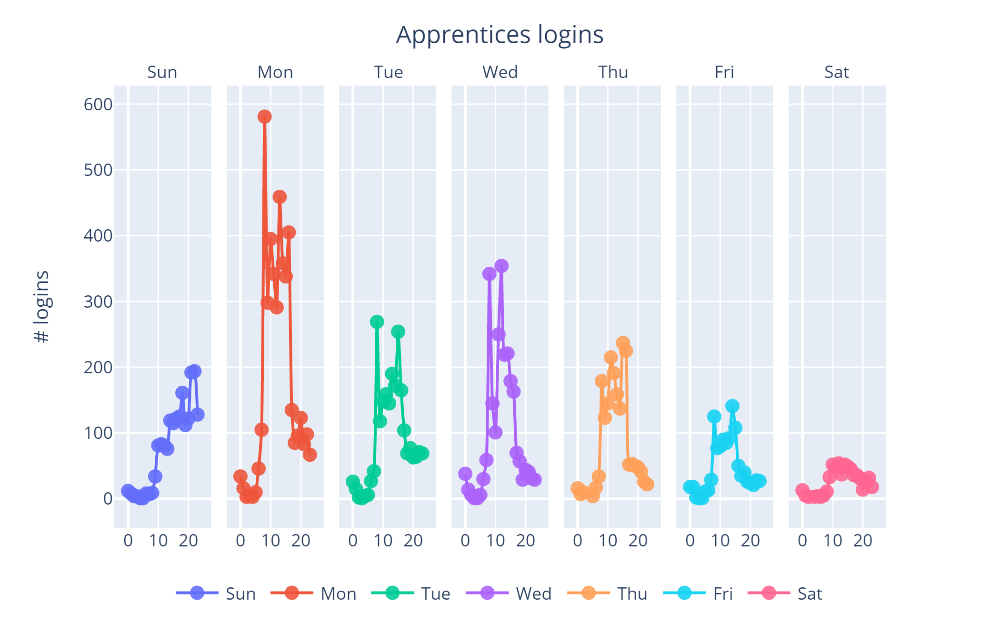

In [58]:
fig = logins_students.groupby(['dayofweek','hour']).size().reset_index(name="count").replace(
    {'dayofweek':dayofweek_map}
).plot(
    x="hour", y=["count"],facet_col='dayofweek', color="dayofweek"
)

fig.update_layout(
    title="Apprentices logins",
    title_x=0.5,
    yaxis_title="# logins",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)

fig.update_xaxes(title=dict(text=""))
fig.update_traces(line_traces)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))

fig.show()
fig.write_html(f"{results_folder}students_logins{suffix}.html" , include_plotlyjs = False)

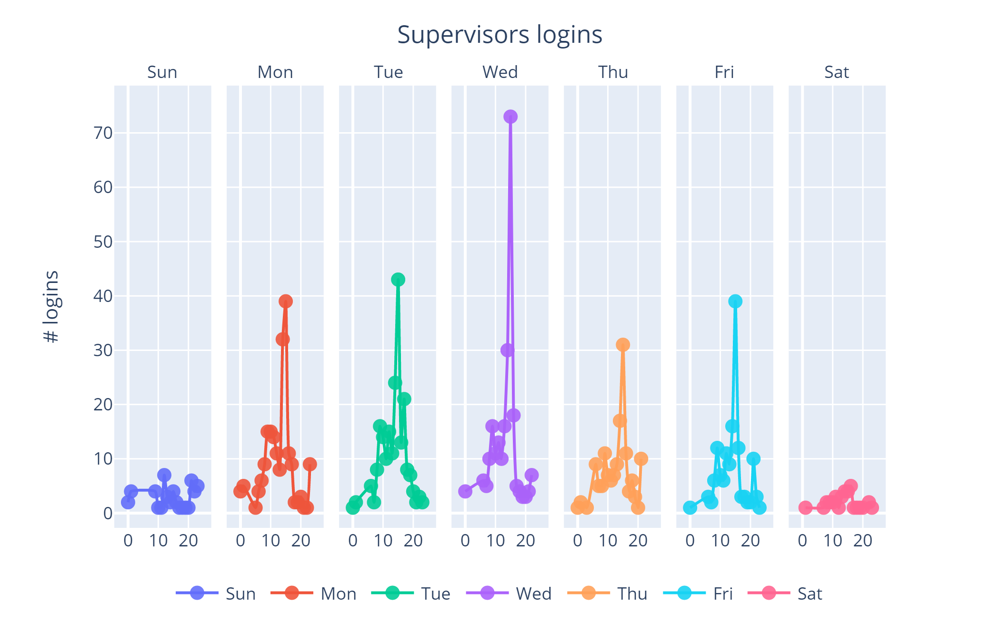

In [59]:
fig = logins_supervisors.groupby(['dayofweek','hour']).size().reset_index(name="count").replace(
    {'dayofweek':dayofweek_map}
).plot(
    x="hour", y=["count"],facet_col='dayofweek', color="dayofweek"
)

fig.update_layout(
    title="Supervisors logins",
    title_x=0.5,
    yaxis_title="# logins",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)

fig.update_xaxes(title=dict(text=""))
fig.update_traces(line_traces)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))

fig.show()
fig.write_html(f"{results_folder}supervisors_logins{suffix}.html" , include_plotlyjs = False)

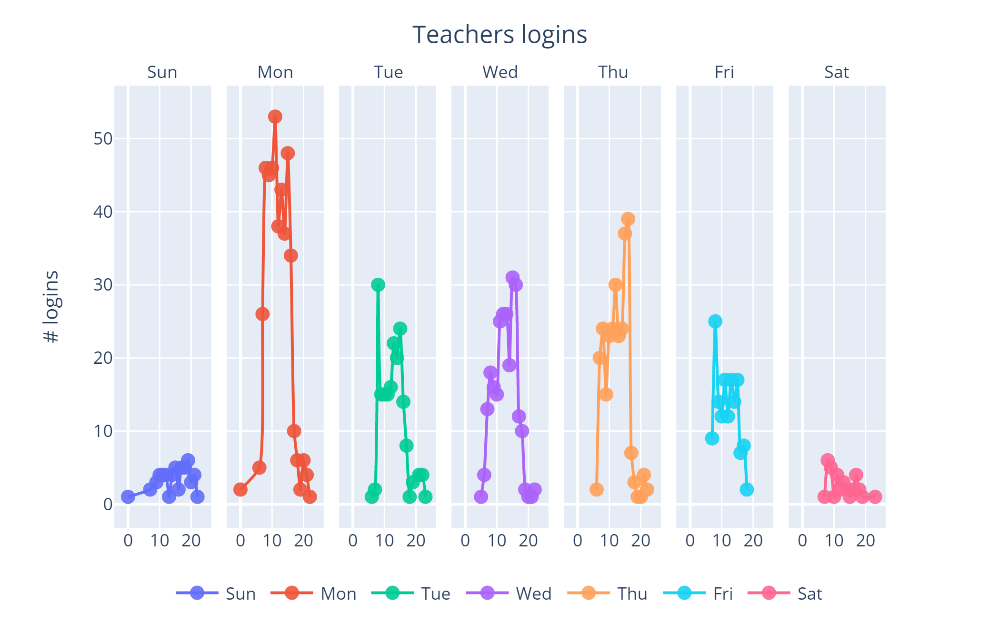

In [60]:
fig = logins_teachers.groupby(['dayofweek','hour']).size().reset_index(name="count").replace(
    {'dayofweek':dayofweek_map}
).plot(
    x="hour", y=["count"],facet_col='dayofweek', color="dayofweek"
)

fig.update_layout(
    title="Teachers logins",
    title_x=0.5,
    yaxis_title="# logins",
    legend_orientation="h",legend=dict(x=0.5, y=-0.1,xanchor='center',yanchor='top'),legend_title_text=''
)

fig.update_xaxes(title=dict(text=""))
fig.update_traces(line_traces)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[1]))

fig.show()
fig.write_html(f"{results_folder}teachers_logins{suffix}.html" , include_plotlyjs = False)